In [1]:
import numpy as np
import os
import sys
from yaml import load
import csv

from IPython.display import Image, display
import PIL.Image
from cStringIO import StringIO

lib_dir = os.path.join(os.getcwd(), "..", "preprocessing")
sys.path.insert(0, lib_dir)

import librosa
import scipy
import audio
import graphic

import scipy.io.wavfile as wav


%matplotlib inline

In [9]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

In [3]:
config = load(open("../learning/config.yaml", "rb"))
csv_reader = csv.reader(open(config["train_data_dir"] ))

audio_files = [filename for (filename, label) in csv_reader]

In [4]:
def show_array(a, fmt='png'):
    a = np.uint8(a)
    f = StringIO()
    PIL.Image.fromarray(a).save(f, fmt)
    display(Image(data=f.getvalue()))

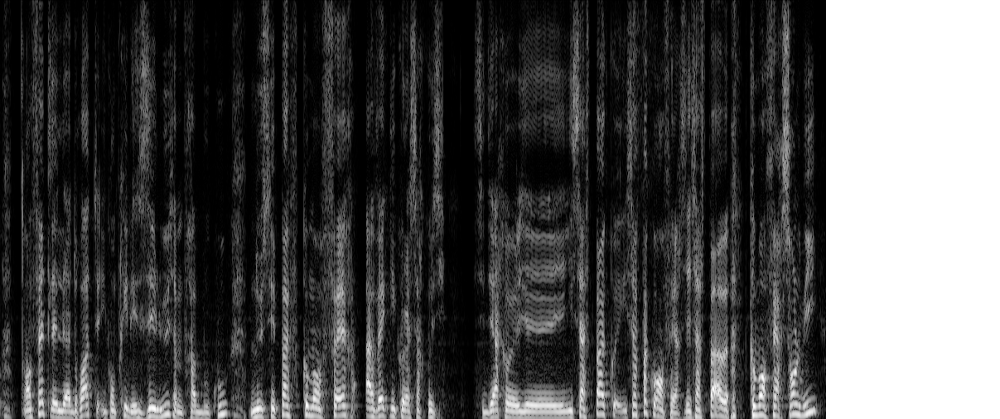

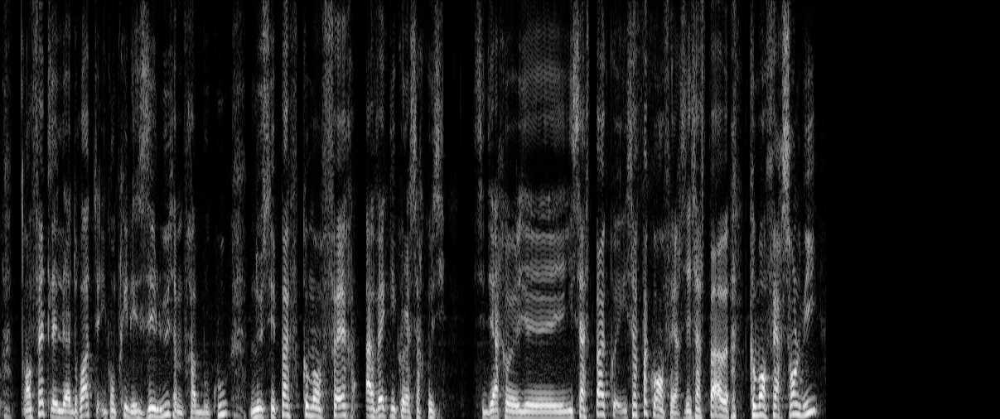

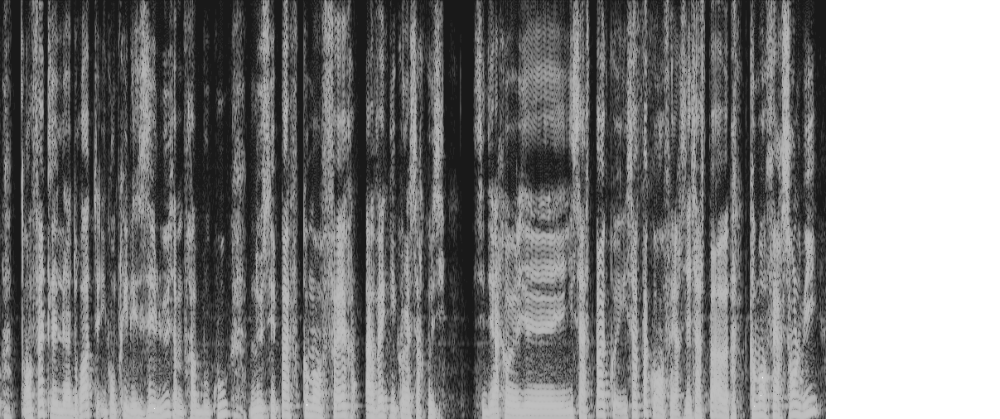

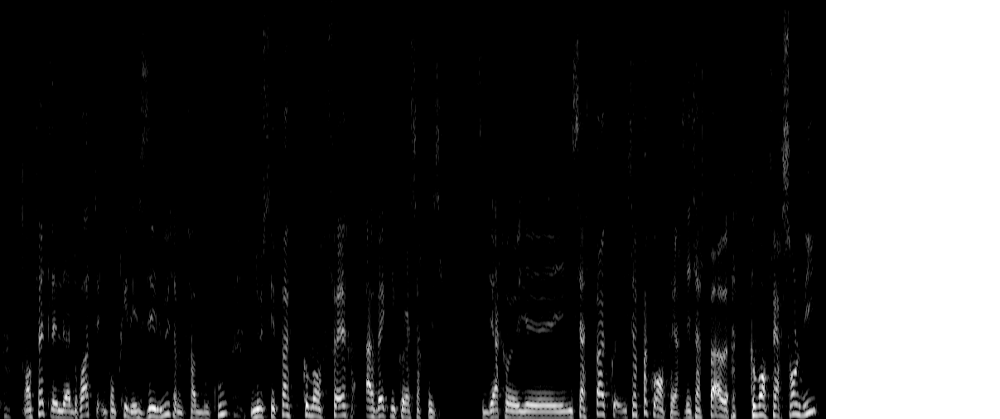

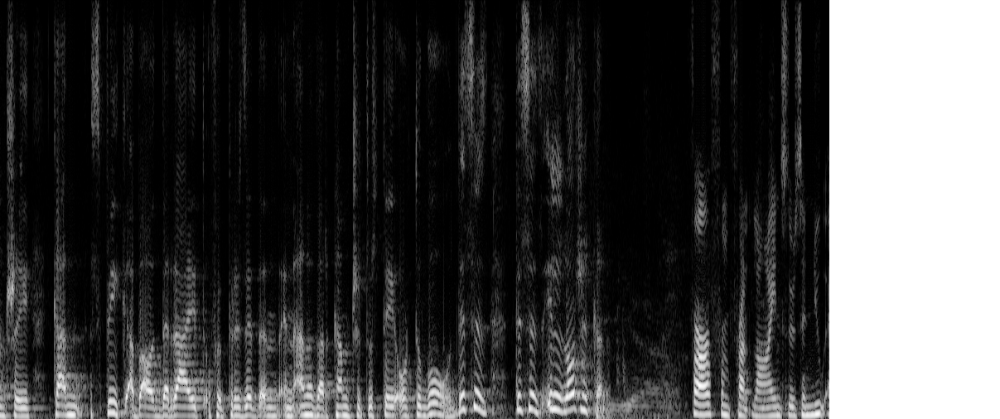

...

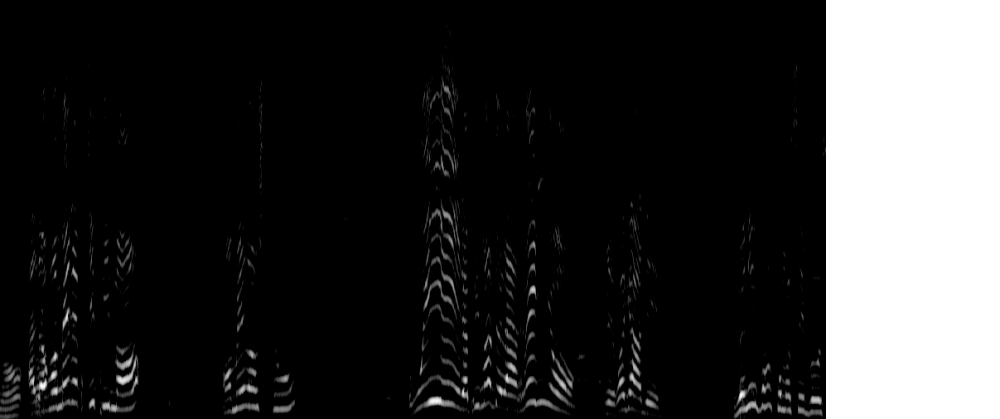

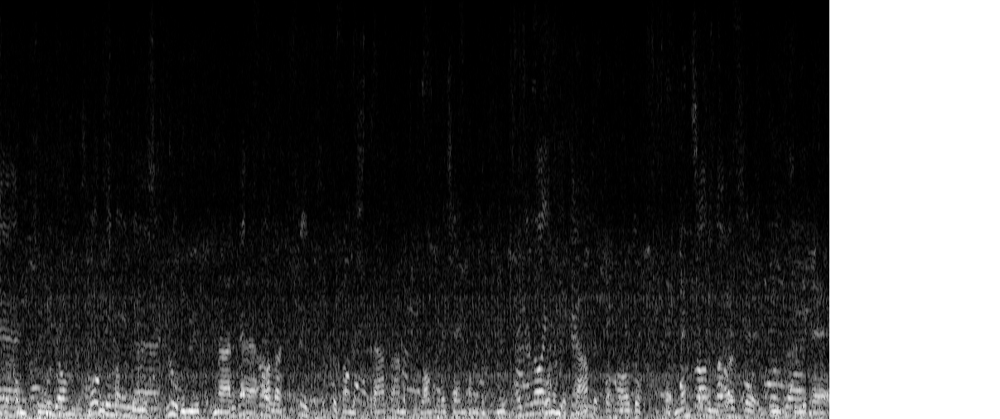

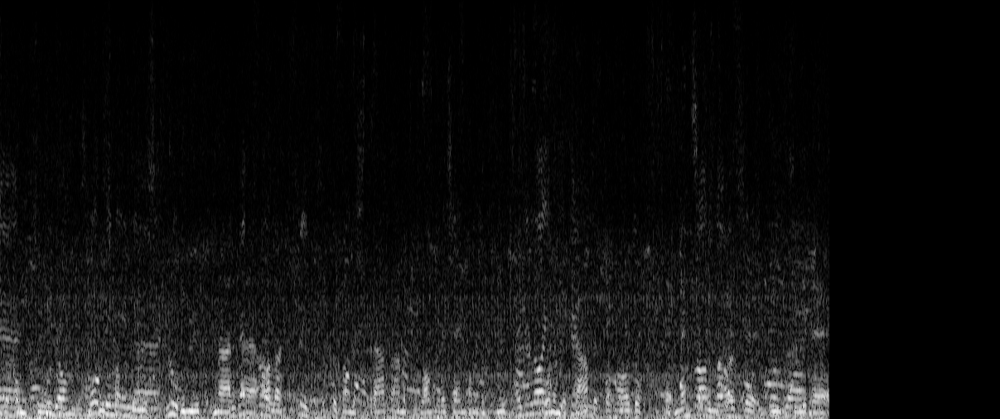

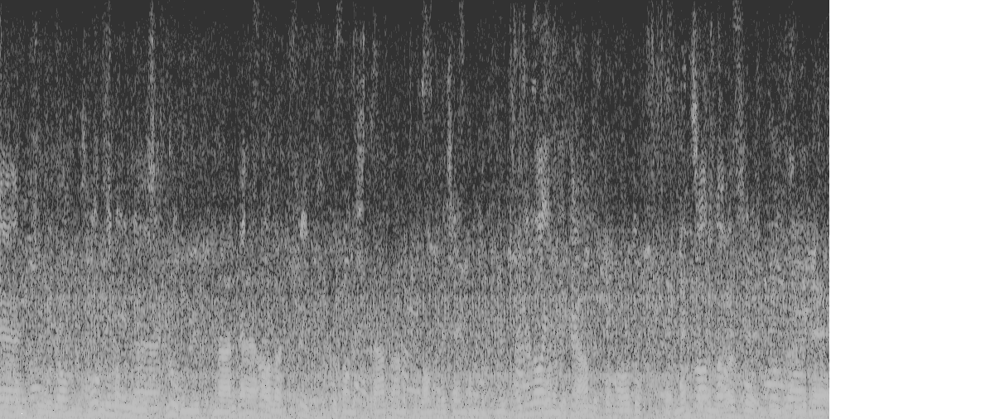

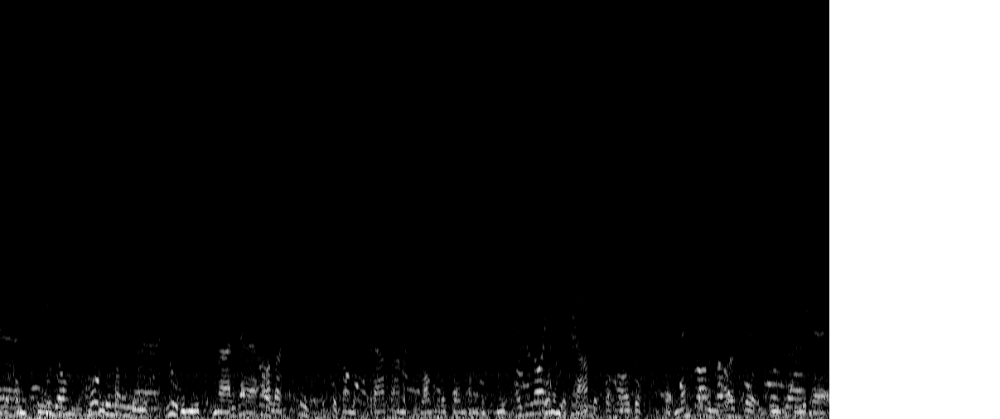

In [10]:
# Various heights for mel banks
results = []
for audio_file in audio_files[:10]:

    sample_rate, signal = wav.read(audio_file)

    spectrogram = audio.spectrogram.spectrogram_cutoff(sample_rate, signal, winlen=0.00833, winstep=0.00833)
    spectrogram = graphic.colormapping.to_rgba(spectrogram, bytes=True)

    spectrogram_grey = graphic.colormapping.to_grayscale(spectrogram, bytes=True)
    spectrogram_equalized = graphic.histeq.histeq(spectrogram)
    spectrogram_clamp_equal = graphic.histeq.clamp_and_equalize(spectrogram)

    results += [spectrogram, spectrogram_grey, spectrogram_equalized, spectrogram_clamp_equal]
    
for image in results:
    padded_image = graphic.windowing.pad_window(image, 1207) 
    show_array(padded_image)


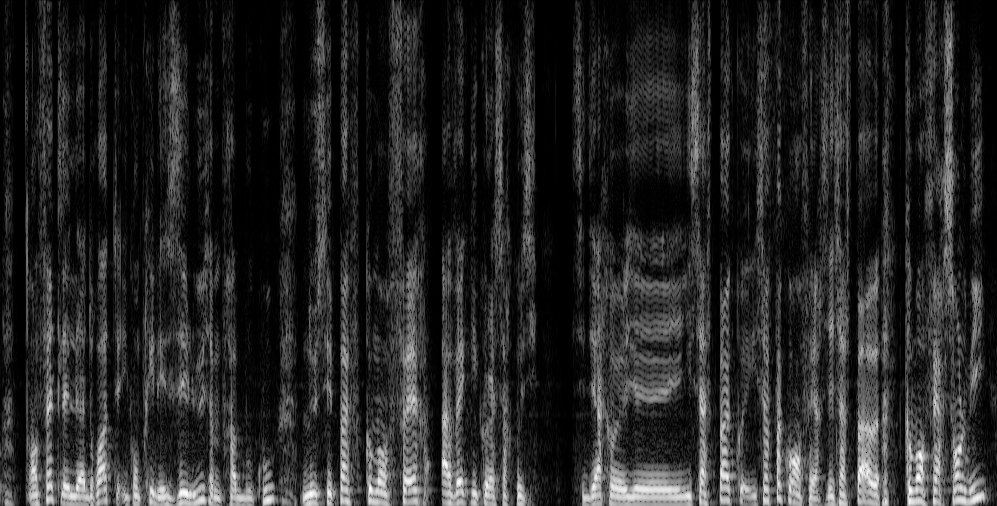

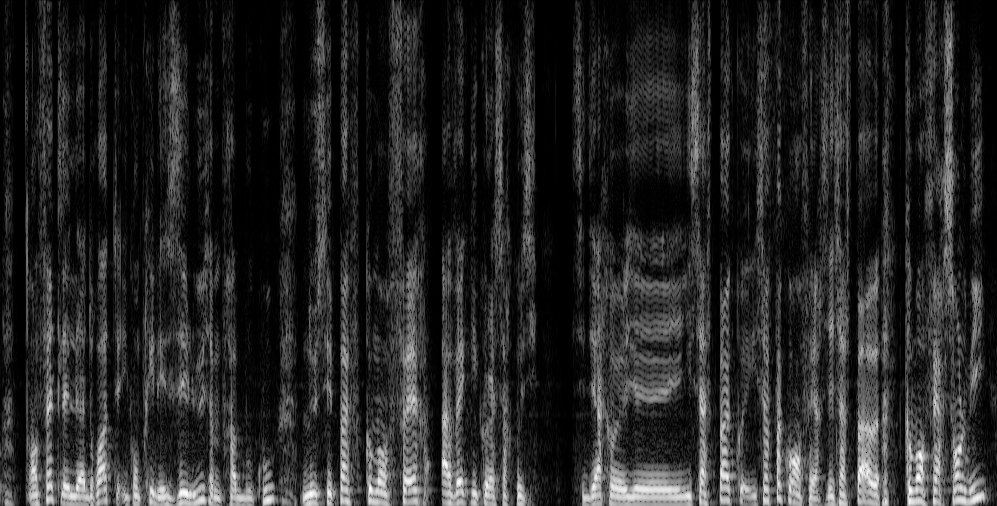

In [19]:
# Default vs custom values
sample_rate, signal = wav.read(audio_files[0])

spectrogram   = audio.spectrogram.spectrogram_cutoff(sample_rate, signal, winlen=0.00833, winstep=0.00833)
spectrogram_2 = audio.spectrogram.spectrogram_cutoff(sample_rate, signal)

show_array(graphic.colormapping.to_rgba(spectrogram, bytes=True))
show_array(graphic.colormapping.to_rgba(spectrogram_2, bytes=True))

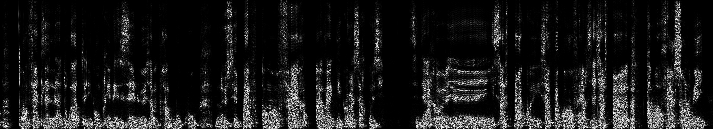

DescribeResult(nobs=91977, minmax=(3.8278809e-08, 338085.56), mean=692.39301, variance=41828448.0, skewness=19.96600341796875, kurtosis=566.3848605212797)

In [18]:
# Scipy's spectrograms
sample_rate, signal = wav.read(audio_files[0])
f, t, spectrogram = scipy.signal.spectrogram(signal, sample_rate)


spectrogram = np.flipud(spectrogram)
show_array(spectrogram)

scipy.stats.describe(spectrogram, axis=None)

(157, 257)


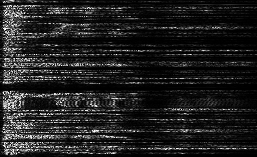

DescribeResult(nobs=40349, minmax=(0.0027332306, 5996.9932), mean=63.941677, variance=52253.363, skewness=9.933877944946289, kurtosis=134.2381708386389)

In [30]:
# Essentia's spectrograms
import essentia
from essentia.standard import Spectrum, Windowing, FrameGenerator
hamming_window = Windowing(type='hamming')
spectrum = Spectrum()  # we just want the magnitude spectrum

spectrogram = np.array([spectrum(hamming_window(frame))
                     for frame in FrameGenerator(essentia.array(signal), frameSize=1024, hopSize=512)])

print(spectrogram.shape)
show_array(spectrogram)
scipy.stats.describe(spectrogram, axis=None)

In [11]:
# Meaning Centering Images
import scipy

sample_rate, signal = wav.read(audio_file)
spectrogram = audio.spectrogram.spectrogram_cutoff(sample_rate, signal, winlen=0.00833, winstep=0.00833)
spectrogram = graphic.colormapping.to_rgba(spectrogram, bytes=True)

print scipy.stats.describe(spectrogram, axis=None)

spectrogram_float = np.divide(spectrogram - 128.0, 128.0)
print scipy.stats.describe(spectrogram_float, axis=None)

print scipy.stats.describe(np.divide(spectrogram, 255.0), axis=None)

mel_centered = (np.divide(spectrogram, 255.0) - 0.5) * 2
print scipy.stats.describe(mel_centered, axis=None)

DescribeResult(nobs=2026024, minmax=(0, 255), mean=81.304603005689955, variance=11301.181102304014, skewness=0.8923057937563504, kurtosis=-1.0375111320573633)
DescribeResult(nobs=2026024, minmax=(-1.0, 0.9921875), mean=-0.36480778901804717, variance=0.68976935438867271, skewness=0.8923057937563504, kurtosis=-1.0375111320573633)
DescribeResult(nobs=2026024, minmax=(0.0, 1.0), mean=0.31884158041447064, variance=0.17379747946642082, skewness=0.8923057937563486, kurtosis=-1.0375111320573656)
DescribeResult(nobs=2026024, minmax=(-1.0, 1.0), mean=-0.36231683917105895, variance=0.69518991786568329, skewness=0.8923057937563496, kurtosis=-1.037511132057365)
